In [1]:
## importing packages
import os
import itertools
from selenium import webdriver
from selenium.webdriver.support.ui import WebDriverWait 
from selenium.webdriver.support import expected_conditions
from bs4 import BeautifulSoup
import re
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt


# Checking directory
current_path = os.getcwd()
current_path

'C:\\Users\\hindu'

In [90]:
## Creating list of airport codes

airport_codes = ['BAH',
'BGW',
'AMM',
'KWI',
'BEY',
'MCT',
'TLV',
'DOH',
'RUH',
'DAM',
'DXB',
'SAH',
'KBL',
'IKA',
'FRU',
'DYU',
'ASB',
'TAS',
'DAC',
'PBH',
'DEL',
'MLE',
'KTM',
'LHE',
'CMB',
'SYD',
'BWN',
'PNH',
'CGK',
'VTE',
'KUL',
'RGN',
'MNL',
'SIN',
'BKK',
'DIL',
'SGN',
'SZX',
'FNJ',
'GUM',
'NRT',
'ICN',
'ULN']

In [91]:
## Creating combinations of origin and destination
combinations = itertools.combinations(airport_codes, 2)

## creating dataframe
rawdata = pd.DataFrame(columns = ["Origin","Destination","Distance"])

In [92]:
## Writing data to the dataframe

for i,j in combinations:
    url = "http://www.gcmap.com/dist?P=" + i + "-" + j 
    chrome_options = webdriver.ChromeOptions()
    chrome_options.add_argument("headless")
    driver = webdriver.Chrome("chromedriver.exe")
    driver.get(url)
    soup=BeautifulSoup(driver.page_source, 'lxml')
    distance = soup.find('td', attrs={'class': 'd'})
    text = distance.get_text()[:-2]
    rawdata = rawdata.append({'Distance' : text,'Origin': i,'Destination': j},ignore_index = True)

C:\Users\hindu\AppData\Local\Temp/ipykernel_2476/461126798.py:7: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome("chromedriver.exe")


In [93]:
## Writing file to CSV
rawdata.to_csv('rawdata.csv')

In [12]:
## Reading file from CSV
data = pd.read_csv("Input_data.csv")


,Origin,Destination,Distance
0,Bahrain,Iraq,616
1,Bahrain,Jordan,962
2,Bahrain,Kuwait,260
3,Bahrain,Lebanon,"1,044"
4,Bahrain,Oman,514
...,...,...,...
898,Guam,Korea,"2,001"
899,Guam,Mongolia,"3,218"
900,Japan,Korea,783
901,Japan,Mongolia,"1,906"


TypeError: '>' not supported between instances of 'str' and 'int'

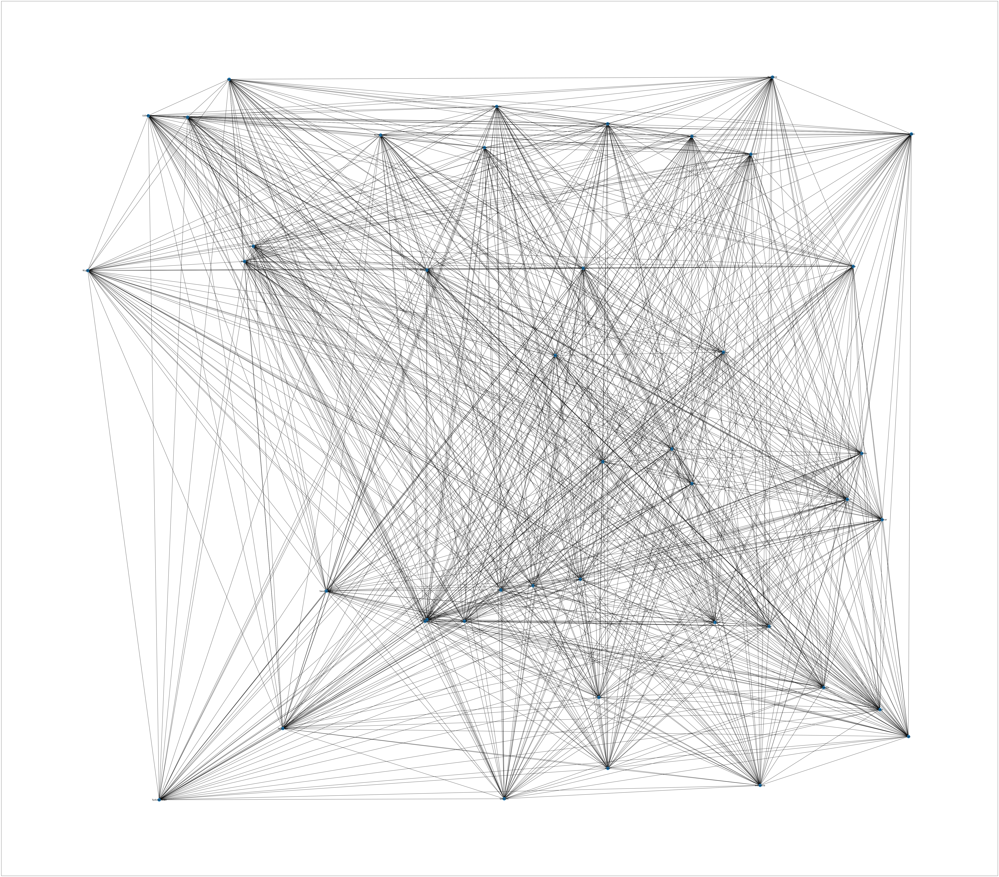

In [16]:
## Visualizing connections

G = nx.from_pandas_edgelist(data,'Origin','Destination',edge_attr = 'Distance')
plt.figure(figsize=(100,90))
pos = nx.random_layout(G)
nx.draw_networkx(G,pos)
greater_than_6_hrs = [x for x in G.edges(data=True) if x[2]['Distance']>3300]
nx.draw_networkx_edges(G, pos, edgelist=greater_than_6_hrs, edge_color='r', alpha=0.4, width=25)